## Mapping the outlier results onto a map:

__Modify code to improve the following:__

1. For the column-aggregated plots on map, use different colors for -100 and +100%.

2. For all Maps, use Grey-color basemaps!

3. 


In [1]:
import numpy as np
import pandas as pd
from scipy.stats import ttest_rel, wilcoxon
import seaborn as sns
import matplotlib.pyplot as plt

import geopandas as gpd
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap, Normalize
# Mapping the MSOA

import folium
from folium.plugins import PolyLineTextPath
from folium.plugins import FeatureGroupSubGroup

import matplotlib.colors as colors
import matplotlib.cm as cm
import branca.colormap as branca_cm

import contextily as ctx
from matplotlib_scalebar.scalebar import ScaleBar
from geodatasets import get_path


#from geo_northarrow import add_north_arrow

## Part 1. Plot Average by MSOAs

In [2]:
r5_diff = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/re_diff_r5.csv', encoding = 'latin1')
osrm_diff = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/re_diff_osrm.csv', encoding = 'latin1')
val_diff = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/re_diff_val.csv', encoding = 'latin1')

In [3]:
#r5_diff.shape
val_diff.shape

(1003002, 10)

In [4]:
# select two columns:
r5_diff_origin_raw = r5_diff[['originID','re_diff_tt']]

r5_diff_origin = r5_diff_origin_raw.groupby('originID').mean()
r5_diff_origin = r5_diff_origin.reset_index()

### 1.1 get aggreagated by dest/origin

In [5]:
def get_agg_mean(df, index_col, agg_col):
    df_agg = df.groupby(index_col)[agg_col].mean()
    df_agg = df_agg.reset_index()
    return df_agg

In [6]:
r5_diff_origin = get_agg_mean(r5_diff, 'originID', 're_diff_tt')
r5_doff_dest = get_agg_mean(r5_diff, 'destinationID', 're_diff_tt')

osrm_diff_origin = get_agg_mean(osrm_diff, 'originID', 're_diff_tt')
osrm_diff_dest = get_agg_mean(osrm_diff, 'destinationID', 're_diff_tt')

val_diff_origin = get_agg_mean(val_diff, 'originID', 're_diff_tt')
val_diff_dest = get_agg_mean(val_diff, 'destinationID', 're_diff_tt')


In [7]:
val_diff_dest.shape

(1002, 2)

get the MSOA:

In [8]:
# read shp file and plot its borders on folium map:
msoa_shape = gpd.read_file(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/msoa/england_msoa_2021.shp')

In [9]:
# print the crs of the shape file:
print(msoa_shape.crs)

EPSG:27700


### 1.2 filter out MSOAs for greater London and add the relative difference values, and merge

In [10]:
# from dataframe all_MSOA_coord_df, column id extract all the msoaIDs, 
# then use these msoaIDs to filter the msoa_shape
msoa_shape = msoa_shape[msoa_shape['msoa21cd'].isin(r5_diff_origin['originID'])]

In [11]:
msoa_shape.head()

,hclnm,hclnmw,label,msoa21cd,msoa21nm,name,geometry
3,Plumstead High Street,None,E92000001E12000007E09000011E02000318,E02000318,Greenwich 006,Greenwich 006,"POLYGON ((546024.231 178810.367, 546024.002 17..."
4,Fulham Broadway,None,E92000001E12000007E09000013E02000388,E02000388,Hammersmith and Fulham 017,Hammersmith and Fulham 017,"POLYGON ((525600.834 177749.054, 525605.642 17..."
13,Streatham Vale,None,E92000001E12000007E09000022E02000652,E02000652,Lambeth 035,Lambeth 035,"POLYGON ((529736.206 170431.382, 529736.499 17..."
15,Queen's Park Gardens,None,E92000001E12000007E09000033E02000963,E02000963,Westminster 004,Westminster 004,"POLYGON ((524291.499 182989.539, 524295.596 18..."
20,Streatham Common,None,E92000001E12000007E09000022E02000651,E02000651,Lambeth 034,Lambeth 034,"POLYGON ((531297.728 171022.395, 531284.488 17..."


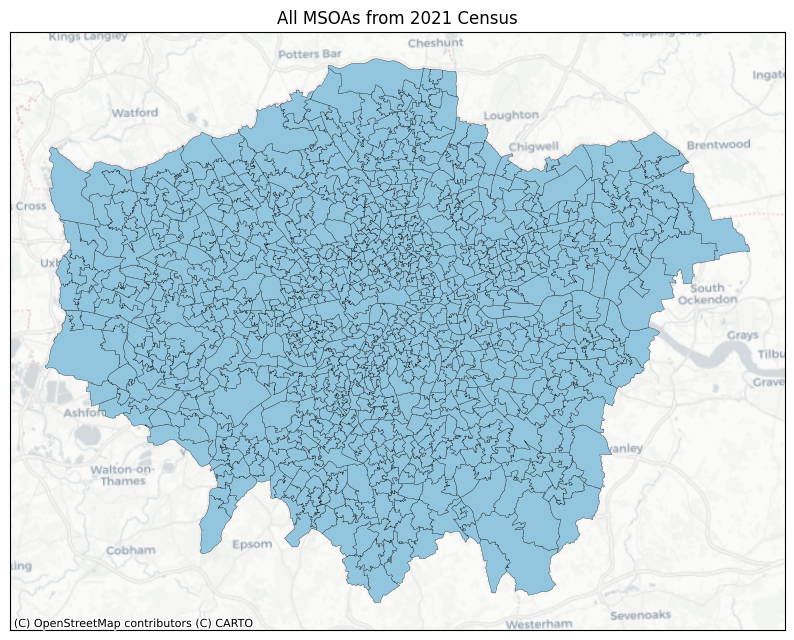

In [12]:
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='#92c5de', edgecolor='black', linewidth=0.2)#edgecolor='none')

# plot msoa borders on carto basmap:


ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        crs=msoa_shape.crs.to_string(),
        zoom=10
    )

ax.set_title('All MSOAs from 2021 Census')
 # Remove axis labels (coordinates)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])
# save to tiff:
plt.savefig('outputmaps/all_msoa.tiff', dpi=300)

plt.show()

In [13]:
msoa_shape.head()

,hclnm,hclnmw,label,msoa21cd,msoa21nm,name,geometry
3,Plumstead High Street,None,E92000001E12000007E09000011E02000318,E02000318,Greenwich 006,Greenwich 006,"POLYGON ((546024.231 178810.367, 546024.002 17..."
4,Fulham Broadway,None,E92000001E12000007E09000013E02000388,E02000388,Hammersmith and Fulham 017,Hammersmith and Fulham 017,"POLYGON ((525600.834 177749.054, 525605.642 17..."
13,Streatham Vale,None,E92000001E12000007E09000022E02000652,E02000652,Lambeth 035,Lambeth 035,"POLYGON ((529736.206 170431.382, 529736.499 17..."
15,Queen's Park Gardens,None,E92000001E12000007E09000033E02000963,E02000963,Westminster 004,Westminster 004,"POLYGON ((524291.499 182989.539, 524295.596 18..."
20,Streatham Common,None,E92000001E12000007E09000022E02000651,E02000651,Lambeth 034,Lambeth 034,"POLYGON ((531297.728 171022.395, 531284.488 17..."


In [14]:
# read in the shp file:
london_boroughs_shp = gpd.read_file(r'/mnt/d/Downloads/lp-consultation-oct-2009-inner-outer-london-shp.zip')

In [15]:
# convert london_boroughs_shp.crs to the same as msoa_shape.crs
#london_boroughs_shp = london_boroughs_shp.to_crs(msoa_shape.crs)

In [16]:
# convert london_boroughs_shp to epsg 4326
london_boroughs_shp = london_boroughs_shp.to_crs(epsg=4326)

In [17]:
msoa_shape_coppy = msoa_shape.copy()

In [18]:
msoa_shape_coppy = msoa_shape_coppy.to_crs(epsg=4326)

In [19]:
london_boroughs_shp.head()

,Boundary,Source,Area_Ha,Shape_Leng,Shape_Area,geometry
0,Inner London,London Plan Consultation Draft,34863.295694,117020.737488,3.486330e+08,"POLYGON ((-0.24344 51.48792, -0.24456 51.48870..."
1,Outer London,London Plan Consultation Draft,124606.812118,373367.664448,1.246068e+09,"POLYGON ((-0.50972 51.46918, -0.50969 51.46920..."


In [20]:
msoa_shape.head()

,hclnm,hclnmw,label,msoa21cd,msoa21nm,name,geometry
3,Plumstead High Street,None,E92000001E12000007E09000011E02000318,E02000318,Greenwich 006,Greenwich 006,"POLYGON ((546024.231 178810.367, 546024.002 17..."
4,Fulham Broadway,None,E92000001E12000007E09000013E02000388,E02000388,Hammersmith and Fulham 017,Hammersmith and Fulham 017,"POLYGON ((525600.834 177749.054, 525605.642 17..."
13,Streatham Vale,None,E92000001E12000007E09000022E02000652,E02000652,Lambeth 035,Lambeth 035,"POLYGON ((529736.206 170431.382, 529736.499 17..."
15,Queen's Park Gardens,None,E92000001E12000007E09000033E02000963,E02000963,Westminster 004,Westminster 004,"POLYGON ((524291.499 182989.539, 524295.596 18..."
20,Streatham Common,None,E92000001E12000007E09000022E02000651,E02000651,Lambeth 034,Lambeth 034,"POLYGON ((531297.728 171022.395, 531284.488 17..."


In [21]:
joined_london_gdf = gpd.sjoin(msoa_shape_coppy, london_boroughs_shp[['Boundary', 'geometry']], how='left', op='within')

# Add the 'London_Region' column to the original GeoDataFrame
msoa_shape['London_Region'] = joined_london_gdf['Boundary']

/home/mengyuwsl/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3466: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [22]:
region_merge = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/re_diff_r5.csv', encoding = 'latin1')

In [23]:
region_merge.head()

,destinationID,originID,re_diff_tt,origin_lat,origin_lon,destination_lat,destination_lon,euclidean_distance,origin_region,destination_region
0,E02000001,E02000002,-15.267176,51.588242,0.139471,51.514382,-0.092411,0.243361,Outer London,Inner London
1,E02000001,E02000003,-23.106796,51.574923,0.140919,51.514382,-0.092411,0.241056,Outer London,Inner London
2,E02000001,E02000004,-14.425428,51.555446,0.176841,51.514382,-0.092411,0.272366,Outer London,Inner London
3,E02000001,E02000005,-18.777293,51.561414,0.143309,51.514382,-0.092411,0.240367,Outer London,Inner London
4,E02000001,E02000007,-19.117647,51.558095,0.157363,51.514382,-0.092411,0.253570,Outer London,Inner London


In [24]:
region_merge.rename(columns={'originID':'msoa21cd'}, inplace=True)
# filter out each msoaID and its region, start a new dataframe, with unique msoaID and region:
msoa_region = region_merge[['msoa21cd', 'origin_region']].drop_duplicates()


In [25]:
# show the unique regions:
msoa_region['origin_region'].unique()

array(['Outer London', 'Inner London', 'Central London'], dtype=object)

In [26]:
msoa_shape.head()

,hclnm,hclnmw,label,msoa21cd,msoa21nm,name,geometry,London_Region
3,Plumstead High Street,None,E92000001E12000007E09000011E02000318,E02000318,Greenwich 006,Greenwich 006,"POLYGON ((546024.231 178810.367, 546024.002 17...",Inner London
4,Fulham Broadway,None,E92000001E12000007E09000013E02000388,E02000388,Hammersmith and Fulham 017,Hammersmith and Fulham 017,"POLYGON ((525600.834 177749.054, 525605.642 17...",Inner London
13,Streatham Vale,None,E92000001E12000007E09000022E02000652,E02000652,Lambeth 035,Lambeth 035,"POLYGON ((529736.206 170431.382, 529736.499 17...",NaN
15,Queen's Park Gardens,None,E92000001E12000007E09000033E02000963,E02000963,Westminster 004,Westminster 004,"POLYGON ((524291.499 182989.539, 524295.596 18...",NaN
20,Streatham Common,None,E92000001E12000007E09000022E02000651,E02000651,Lambeth 034,Lambeth 034,"POLYGON ((531297.728 171022.395, 531284.488 17...",NaN


In [35]:
msoa_region.head()

,msoa21cd,origin_region
0,E02000002,Outer London
1,E02000003,Outer London
2,E02000004,Outer London
3,E02000005,Outer London
4,E02000007,Outer London


In [28]:
# join the region_merge with msoa_shape, destinationID is the key, add the column 'London_Region' to the msoa_shape
msoa_shape = msoa_shape.merge(msoa_region[['msoa21cd', 'origin_region']], on='msoa21cd', how='left')

In [29]:
msoa_shape.origin_region.unique()

array(['Inner London', 'Outer London', 'Central London'], dtype=object)

In [30]:
from shapely.geometry import Polygon, Point

In [31]:
london_boroughs_shp.shape

(2, 6)

In [32]:
colors = [ '#ca0020','#92c5de','#0571b0']

In [33]:



top_over_re_diff_val_here_top_n_gdf
top_under_re_diff_val_here_top_n_gdf

NameError: name 'top_over_re_diff_val_here_top_n_gdf' is not defined

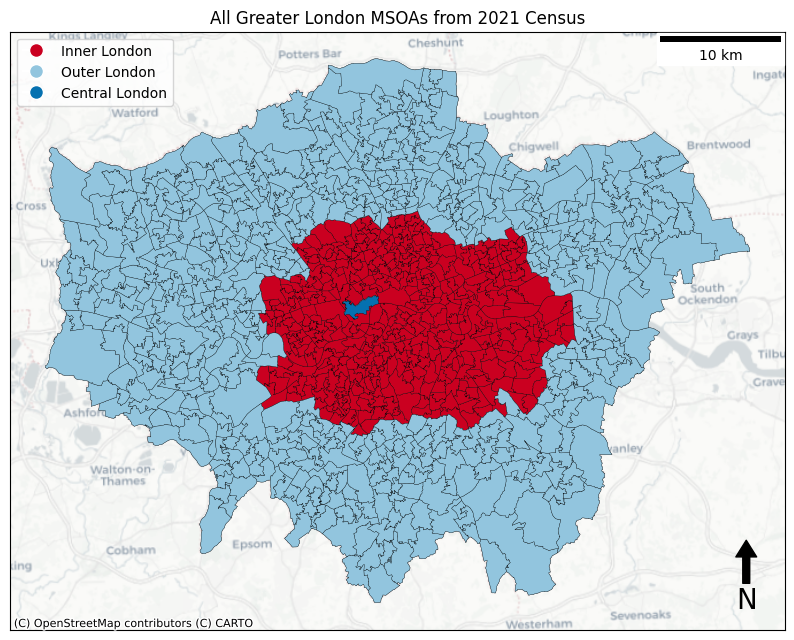

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='#92c5de', edgecolor='black', linewidth=0.2)#edgecolor='none')

regions = msoa_shape['origin_region'].unique()
for region, color in zip(regions, colors):
    msoa_shape[msoa_shape['origin_region'] == region].plot(ax=ax, color=color, edgecolor='black', linewidth=0.2)

# plot msoa borders on carto basmap:
ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        crs=msoa_shape.crs.to_string(),
        zoom=10
    )

ax.add_artist(ScaleBar(1))
    
x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

ax.set_title('All Greater London MSOAs from 2021 Census')
 # Remove axis labels (coordinates)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])

# Create the legend
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', label='Inner London', markerfacecolor=colors[0], markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Outer London', markerfacecolor=colors[1], markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='Central London', markerfacecolor=colors[2], markersize=10)
]

ax.legend(handles=legend_elements, loc='upper left')

# save to tiff:
plt.savefig('outputmaps/all_msoa.tiff', dpi=300)

plt.show()

In [36]:
#add re_diff_tt to msoa_shape:
msoa_shape = msoa_shape.merge(r5_diff_origin, left_on='msoa21cd', right_on='originID', how='left')
msoa_shape = msoa_shape.rename(columns={'re_diff_tt':'re_diff_tt_origin_r5'})


msoa_shape = msoa_shape.merge(r5_doff_dest, left_on='msoa21cd', right_on='destinationID', how='left')
msoa_shape = msoa_shape.rename(columns={'re_diff_tt':'re_diff_tt_dest_r5'})


msoa_shape = msoa_shape.merge(osrm_diff_origin, left_on='msoa21cd', right_on='originID', how='left')
msoa_shape = msoa_shape.rename(columns={'re_diff_tt':'re_diff_tt_origin_osrm'})

msoa_shape = msoa_shape.merge(osrm_diff_dest, left_on='msoa21cd', right_on='destinationID', how='left')
msoa_shape = msoa_shape.rename(columns={'re_diff_tt':'re_diff_tt_dest_osrm'})

msoa_shape = msoa_shape.merge(val_diff_origin, left_on='msoa21cd', right_on='originID', how='left')
msoa_shape = msoa_shape.rename(columns={'re_diff_tt':'re_diff_tt_origin_val'})

msoa_shape = msoa_shape.merge(val_diff_dest, left_on='msoa21cd', right_on='destinationID', how='left')
msoa_shape = msoa_shape.rename(columns={'re_diff_tt':'re_diff_tt_dest_val'})


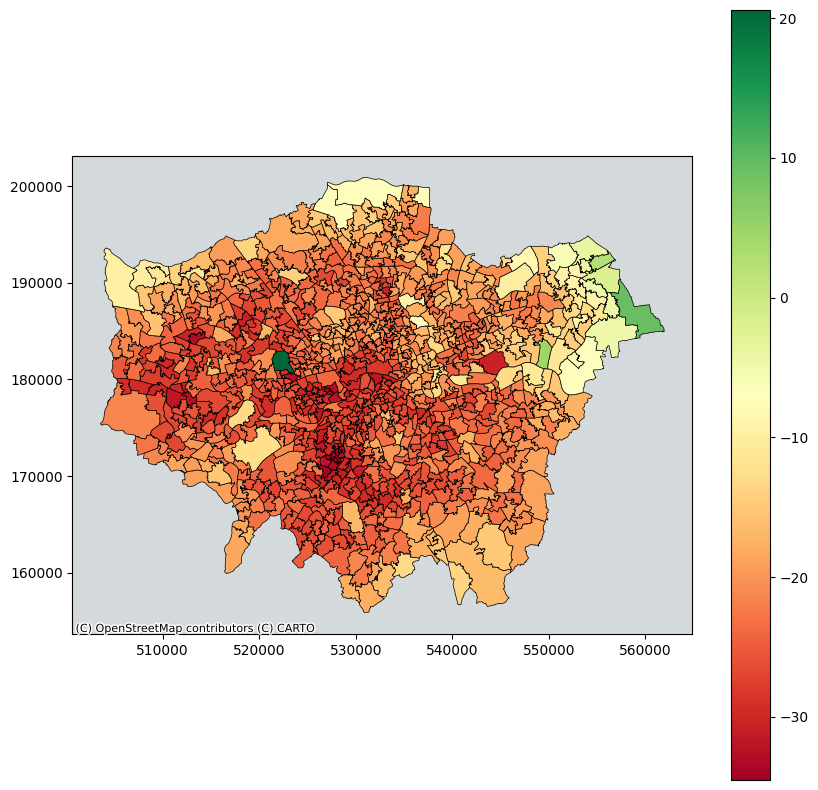

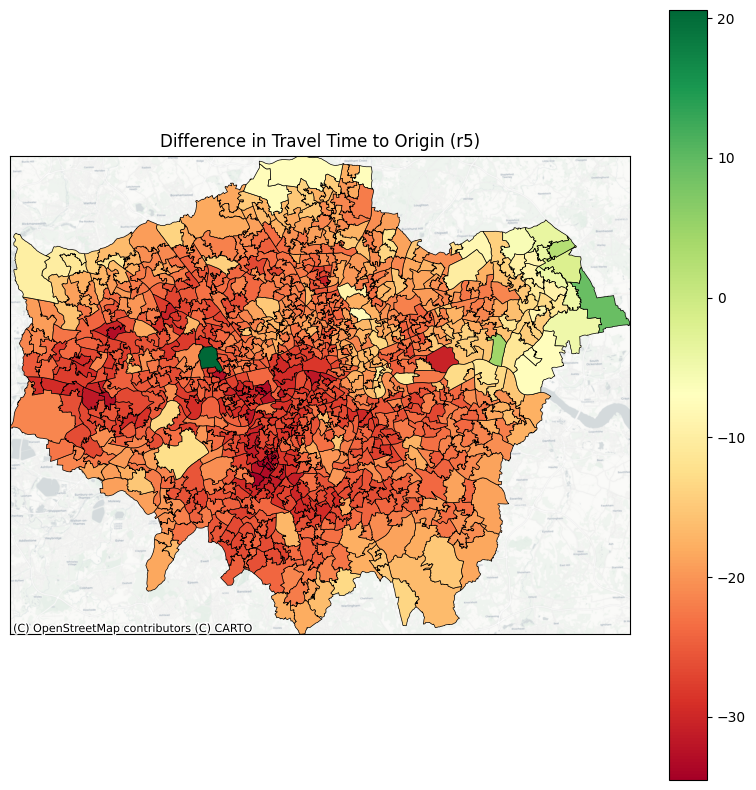

In [ ]:
# Adjust the buffer values to control the size of the black and white area
xmin, ymin, xmax, ymax = msoa_shape.total_bounds
buffer_size = 0.1  # Adjust as needed based on the coordinate reference system (CRS)
xmin -= buffer_size
ymin -= buffer_size
xmax += buffer_size
ymax += buffer_size

# Plot with Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
msoa_shape.plot(
    ax=ax,
    column='re_diff_tt_origin_r5',
    cmap='RdYlGn',
    legend=True,
    edgecolor='black',
    linewidth=0.5
)

# Add basemap outside the area of interest
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),  # Ensure the CRS is correctly passed
    zoom=12
)

# Set the extent to include the buffered area
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])

# Remove axis labels (coordinates)
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])

# Add a title (optional)
ax.set_title('Difference in Travel Time to Origin (R5)')

# Save as TIFF
plt.savefig('re_diff_tt_origin_r5_with_basemap.tiff', dpi=300)

# Show the plot (optional)
plt.show()

In [ ]:
msoa_shape.head()

,hclnm,hclnmw,label,msoa21cd,msoa21nm,name,geometry,originID_x,re_diff_tt_origin_r5,destinationID_x,re_diff_tt_dest_r5,originID_y,re_diff_tt_origin_osrm,destinationID_y,re_diff_tt_dest_osrm
0,Plumstead High Street,None,E92000001E12000007E09000011E02000318,E02000318,Greenwich 006,Greenwich 006,"POLYGON ((546024.231 178810.367, 546024.002 17...",E02000318,-23.829541,E02000318,-25.444763,E02000318,-27.443565,E02000318,-29.884040
1,Fulham Broadway,None,E92000001E12000007E09000013E02000388,E02000388,Hammersmith and Fulham 017,Hammersmith and Fulham 017,"POLYGON ((525600.834 177749.054, 525605.642 17...",E02000388,-27.112121,E02000388,-24.566132,E02000388,-32.141563,E02000388,-29.544651
2,Streatham Vale,None,E92000001E12000007E09000022E02000652,E02000652,Lambeth 035,Lambeth 035,"POLYGON ((529736.206 170431.382, 529736.499 17...",E02000652,-27.189310,E02000652,-24.903481,E02000652,-33.521600,E02000652,-29.725393
3,Queen's Park Gardens,None,E92000001E12000007E09000033E02000963,E02000963,Westminster 004,Westminster 004,"POLYGON ((524291.499 182989.539, 524295.596 18...",E02000963,-24.048614,E02000963,-21.020387,E02000963,-30.947384,E02000963,-27.498763
4,Streatham Common,None,E92000001E12000007E09000022E02000651,E02000651,Lambeth 034,Lambeth 034,"POLYGON ((531297.728 171022.395, 531284.488 17...",E02000651,-30.882702,E02000651,-26.129727,E02000651,-35.818779,E02000651,-31.360002


In [ ]:
#columns = ['re_diff_tt_origin_r5', 're_diff_tt_dest_r5', 're_diff_tt_origin_osrm', 're_diff_tt_dest_osrm', 're_diff_tt_origin_val', 're_diff_tt_dest_val']

In [37]:
max(msoa_shape[columns].max())

20.57331268511519

In [39]:
# Adjust the buffer values to control the size of the black and white area
xmin, ymin, xmax, ymax = msoa_shape.total_bounds
buffer_size = 0.1  # Adjust as needed based on the coordinate reference system (CRS)
xmin -= buffer_size
ymin -= buffer_size
xmax += buffer_size
ymax += buffer_size

https://colorbrewer2.org/#type=diverging&scheme=RdBu&n=5
Colors pulled from the above link

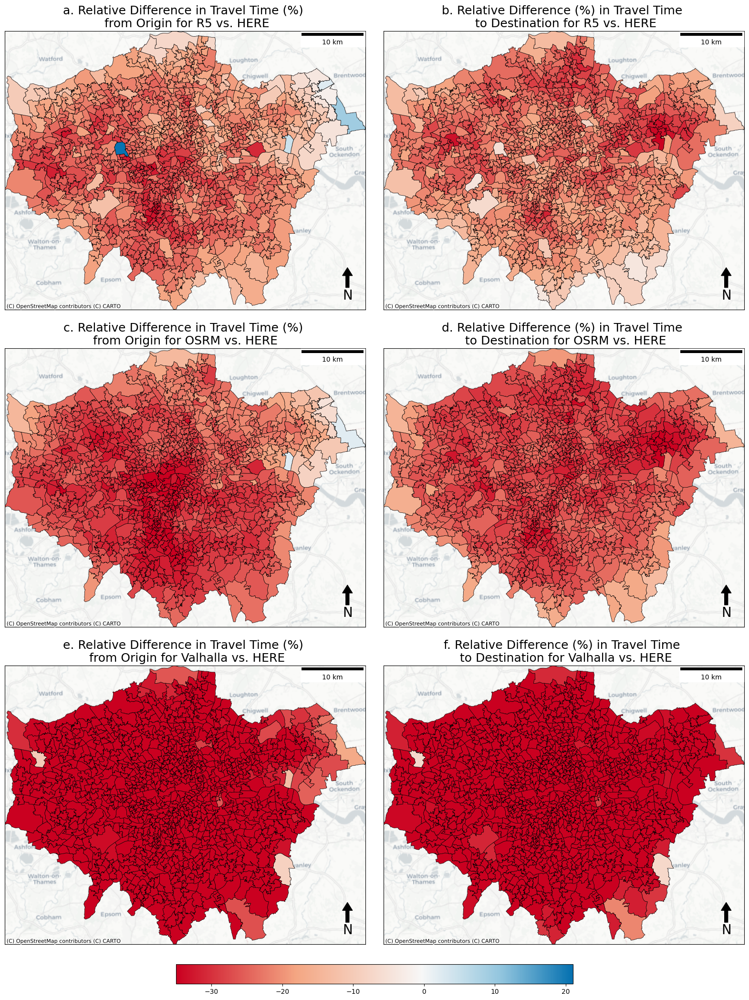

In [40]:
# Assuming the columns to be plotted are 're_diff_tt_origin_r5', 'column2', 'column3', and 'column4'
columns = ['re_diff_tt_origin_r5', 're_diff_tt_dest_r5', 're_diff_tt_origin_osrm', 're_diff_tt_dest_osrm', 're_diff_tt_origin_val', 're_diff_tt_dest_val']
titles = ['a. Relative Difference in Travel Time (%) \n from Origin for R5 vs. HERE', 'b. Relative Difference (%) in Travel Time \n to Destination for R5 vs. HERE', 
          'c. Relative Difference in Travel Time (%) \n from Origin for OSRM vs. HERE ', 'd. Relative Difference (%) in Travel Time \n to Destination for OSRM vs. HERE',
          'e. Relative Difference in Travel Time (%) \n from Origin for Valhalla vs. HERE', 'f. Relative Difference (%) in Travel Time \n to Destination for Valhalla vs. HERE']

# Determine the common color scale
#vmin = min(msoa_shape[columns].min())
#vmax = max(msoa_shape[columns].max())
vmin = -35
vmax = 21

# Define a custom colormap with threshold highlighting
#below_threshold_colors = [(0.984, 0.922, 0.839), (0.733, 0.655, 0.494)]  # Lighter Cividis colors
#above_threshold_colors = [(0.275, 0.184, 0.090), (0.122, 0.051, 0.016)]  # Darker Cividis colors

#below_threshold_colors = [(0.10, 0.2, 0.1),(1, 1, 1),]  # Lighter neutral to red
#above_threshold_colors = [(0.5, 0.5, 1), (0.122, 0.051, 0.016)] # Lighter neutral to blue

#below_threshold_colors = [(0.97, 0.05, 0), (1, 1, 1)]  # Red to white
#above_threshold_colors = [(0, 0, 0.99)]  # White to blue

# Combine the colors with a midpoint to split the colormap
#colors = below_threshold_colors + above_threshold_colors

#colors = [(0.97, 0.1, 0), (1, 1, 1), (0, 0.1, 0.99)] 
colors = [ '#ca0020','#f4a582','#f7f7f7','#92c5de','#0571b0']

n_bins = [0, 0.3, 0.62, 0.82 ,1]
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(n_bins, colors)), N=256)

# Create a figure with subplots
fig, axes = plt.subplots(3, 2, figsize=(20, 27))

# Adjust the spacing between subplots
fig.subplots_adjust(wspace=0.05, hspace=0.0000000000000000000000000001)

# Flatten axes for easy iteration
axes = axes.flatten()

counter = 0 
for ax, column in zip(axes, columns):
    msoa_shape.plot(
        ax=ax,
        column=column,
        #cmap='RdYlGn',
        cmap = custom_cmap,
        #cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        legend=False,  # Disable individual legends
        edgecolor='black',
        linewidth=0.5
    )
    # Add basemap
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        crs=msoa_shape.crs.to_string(),
        zoom=10
    )
    # Set the extent to include the buffered area
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    # Remove axis labels (coordinates)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([])
    ax.set_yticks([])
    # Add a title for each subplot
    ax.set_title(titles[counter], fontsize=18)
    ax.add_artist(ScaleBar(1))
    counter += 1
    x, y, arrow_length = 0.95, 0.15, 0.1
    ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

# Add a single colorbar for all subplots
#fig.colorbar(plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=vmin, vmax=vmax)), ax=axes, orientation='vertical', fraction=0.02, pad=0.02)
#custom_cmap
fig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax)), ax=axes, orientation='horizontal', fraction=0.02, pad=0.02)
#fig.colorbar(plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=vmin, vmax=vmax)), ax=axes, orientation='horizontal', fraction=0.02, pad=0.02)
# Save as TIFF
plt.savefig('outputmaps/combined_diff_tt_origin_with_basemap_v3.tiff', dpi=400)

# Show the plot (optional)
plt.show()

## Part 2 Add top-n knowledge and plot the top 20 overestimations and underestimations by both OSRM and R5.



In [48]:
msoa_london = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/msoa/processed/gld_msoa_centroids.csv', encoding='latin1')
# see if the column msoa21cd is unique:
msoa_london['msoa21cd'].nunique() == msoa_london.shape[0]

# follow this format: [{"lat": ..., "lng": ...}, ...]

# new dict origin: 1002 maoas
all_MSOA_coord_dict = {}

# for reference dict, read the msoa_london, use msoa21cd as key, lat and lon as value:
for i in range(msoa_london.shape[0]):
    msoaID = msoa_london.iloc[i, 3]
    lat = msoa_london.iloc[i, 8]
    lon = msoa_london.iloc[i, 9]
    #origin_coord.append({"lat": lat, "lng": lon})
    all_MSOA_coord_dict[msoaID] = {"lat": lat, "lng": lon}
all_MSOA_coord_df = pd.DataFrame(all_MSOA_coord_dict).T
all_MSOA_coord_df = all_MSOA_coord_df.reset_index()

all_MSOA_coord_df.columns = ['id', 'lat', 'lon']

all_MSOA_coord_df['geometry'] = all_MSOA_coord_df.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
all_MSOA_gdf = gpd.GeoDataFrame(all_MSOA_coord_df, geometry='geometry')
all_MSOA_gdf.set_crs(epsg=4326, inplace=True)  



all_MSOA_gdf_copy = all_MSOA_gdf.copy()
# Renaming columns to match IDs in top_under_re_diff_osrm_here_top_n
all_MSOA_gdf_copy = all_MSOA_gdf_copy.rename(columns={'id': 'ID', 'lat': 'latitude', 'lon': 'longitude'})

def merge_msoa_with_coord(input_df):
    # Merge on originID
    merged_df = input_df.merge(all_MSOA_gdf_copy, how='left', left_on='originID', right_on='ID')
    merged_df = merged_df.rename(columns={'latitude': 'origin_lat', 'longitude': 'origin_lon'})
    merged_df = merged_df.drop(columns=['ID'])

    # Merge on destinationID
    merged_df = merged_df.merge(all_MSOA_gdf_copy, how='left', left_on='destinationID', right_on='ID')
    merged_df = merged_df.rename(columns={'latitude': 'destination_lat', 'longitude': 'destination_lon'})
    merged_df = merged_df.drop(columns=['ID'])
    return merged_df

In [14]:
all_MSOA_gdf_copy.head()

,ID,latitude,longitude,geometry
0,E02000318,51.488265,0.095618,POINT (0.09562 51.48827)
1,E02000388,51.483157,-0.198445,POINT (-0.19845 51.48316)
2,E02000652,51.415041,-0.138046,POINT (-0.13805 51.41504)
3,E02000963,51.529079,-0.209371,POINT (-0.20937 51.52908)
4,E02000651,51.419153,-0.125942,POINT (-0.12594 51.41915)


In [49]:
r5TTM = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/ttm_r5py_nan_handled.csv', encoding='latin1')
hereTTM = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/here_routing_matrix_format.csv', encoding='latin1')
osrm_TTM = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/osrmTTM.csv', encoding='latin1')
val_TTM = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/ttm_valhalla.csv', encoding='latin1')

# make the first column the index:
r5TTM.set_index('originID', inplace=True)
hereTTM.set_index('originID', inplace=True)
osrm_TTM.set_index('origin_msoaID', inplace=True)
val_TTM.set_index('originID', inplace=True)

# times 60 for all elements in the matrix
r5TTM = r5TTM * 60

def find_top_n(input_diff_df, top_n, smallest_or_largest,difference_type):
    """
    difference_type: difference or relative_difference
    top n overestimations: False
    top n underestimations: True
    """
    # 
    ranked_df = input_diff_df.unstack()
    df_top_n = ranked_df.sort_values(ascending=smallest_or_largest).head(top_n)
    df_top_n = df_top_n.reset_index()
    df_top_n.columns = [ 'destinationID', 'originID', difference_type]
    return df_top_n



In [50]:
# Relative difference matrices
re_diff_r5_here = ((r5TTM - hereTTM) / hereTTM) * 100
re_diff_osrm_here = ((osrm_TTM - hereTTM) / hereTTM) * 100
re_diff_val_here = ((val_TTM - hereTTM) / hereTTM) * 100

In [52]:
top_n = 20 

In [53]:
top_over_re_diff_r5_here = find_top_n(re_diff_r5_here, top_n, False, 'relative_difference_percentage')
top_under_estimates_re_diff_r5_here = find_top_n(re_diff_r5_here, top_n, True, 'relative_difference_percentage')

top_over_re_diff_osrm_here_top_n = find_top_n(re_diff_osrm_here, top_n, False, 'relative_difference_percentage')
top_under_re_diff_osrm_here_top_n = find_top_n(re_diff_osrm_here, top_n, True, 'relative_difference_percentage')

top_over_re_diff_val_here_top_n = find_top_n(re_diff_val_here, top_n, False, 'relative_difference_percentage')
top_under_re_diff_val_here_top_n = find_top_n(re_diff_val_here, top_n, True, 'relative_difference_percentage')

In [41]:
top_over_re_diff_val_here_top_n

,destinationID_x,originID_x,relative_difference_percentage
0,E02000529,E02000530,404.481818
1,E02000503,E02000502,318.218841
2,E02000502,E02000503,303.291197
3,E02000502,E02006796,287.518095
4,E02000414,E02000409,225.307914
5,E02000145,E02000155,195.597030
6,E02006796,E02000502,184.013679
7,E02000145,E02000158,154.281670
8,E02000145,E02000149,153.773171
9,E02000158,E02000145,152.873566


In [54]:
# rename top_over_re_diff_val_here_top_n originID and destinationID to originID_x and destinationID_x:
top_over_re_diff_r5_here = top_over_re_diff_r5_here.rename(columns={'originID': 'originID_x', 'destinationID': 'destinationID_x'})
top_under_estimates_re_diff_r5_here = top_under_estimates_re_diff_r5_here.rename(columns={'originID': 'originID_x', 'destinationID': 'destinationID_x'})

top_over_re_diff_osrm_here_top_n = top_over_re_diff_osrm_here_top_n.rename(columns={'originID': 'originID_x', 'destinationID': 'destinationID_x'})
top_under_re_diff_osrm_here_top_n = top_under_re_diff_osrm_here_top_n.rename(columns={'originID': 'originID_x', 'destinationID': 'destinationID_x'})


top_over_re_diff_val_here_top_n = top_over_re_diff_val_here_top_n.rename(columns={'originID': 'originID_x', 'destinationID': 'destinationID_x'})
top_under_re_diff_val_here_top_n = top_under_re_diff_val_here_top_n.rename(columns={'originID': 'originID_x', 'destinationID': 'destinationID_x'})



In [49]:
top_over_re_diff_val_here_top_n

,destinationID_x,originID_x,relative_difference_percentage
0,E02000529,E02000530,404.481818
1,E02000503,E02000502,318.218841
2,E02000502,E02000503,303.291197
3,E02000502,E02006796,287.518095
4,E02000414,E02000409,225.307914
5,E02000145,E02000155,195.597030
6,E02006796,E02000502,184.013679
7,E02000145,E02000158,154.281670
8,E02000145,E02000149,153.773171
9,E02000158,E02000145,152.873566


In [55]:
def merge_with_proper_crs(input_df, msoa_shape_filtered):
    # Merge with the proper CRS
    df_merged_dest = input_df.merge(msoa_shape_filtered, how='left', left_on='destinationID_x', right_on='msoa21cd')
    df_merged_dest = df_merged_dest.rename(columns={'geometry': 'dest_geometry'})
    df_merged = df_merged_dest.merge(msoa_shape_filtered, how='left', left_on='originID_x', right_on='msoa21cd')
    df_merged = df_merged.rename(columns={'geometry': 'origin_geometry'})
    merged_gdf = gpd.GeoDataFrame(df_merged, geometry='dest_geometry')
    return merged_gdf

In [56]:
# get a copy of msoa shape, keep only msoa21cd and geometry:
msoa_shape_filtered = msoa_shape[['msoa21cd', 'geometry']]

In [23]:
top_over_re_diff_osrm_here_top_n.head()

,destinationID_x,originID_x,relative_difference_percentage
0,E02000529,E02000530,481.666667
1,E02000414,E02000409,306.906475
2,E02000357,E02000359,196.126126
3,E02000359,E02000357,191.944444
4,E02000795,E02000935,136.200980


In [56]:
top_over_re_diff_osrm_here_top_n.head()

,destinationID_x,originID,relative_difference_percentage
0,E02000529,E02000530,481.666667
1,E02000414,E02000409,306.906475
2,E02000357,E02000359,196.126126
3,E02000359,E02000357,191.944444
4,E02000795,E02000935,136.200980


In [57]:
top_over_re_diff_r5_here_gdf = merge_with_proper_crs(top_over_re_diff_r5_here, msoa_shape_filtered)
top_under_re_diff_r5_here_gdf = merge_with_proper_crs(top_under_estimates_re_diff_r5_here, msoa_shape_filtered)

top_over_re_diff_osrm_here_top_n_gdf = merge_with_proper_crs(top_over_re_diff_osrm_here_top_n, msoa_shape_filtered)
top_under_re_diff_osrm_here_top_n_gdf = merge_with_proper_crs(top_under_re_diff_osrm_here_top_n, msoa_shape_filtered)

top_over_re_diff_val_here_top_n_gdf = merge_with_proper_crs(top_over_re_diff_val_here_top_n, msoa_shape_filtered)
top_under_re_diff_val_here_top_n_gdf = merge_with_proper_crs(top_under_re_diff_val_here_top_n, msoa_shape_filtered)


In [43]:
#merged_df_under_osrm = merge_msoa_with_coord(top_under_re_diff_osrm_here_top_n)

#merged_df_over_osrm = merge_msoa_with_coord(top_over_re_diff_osrm_here_top_n)

#merged_df_under_r5 = merge_msoa_with_coord(top_under_estimates_re_diff_r5_here)

#merged_df_over_r5 = merge_msoa_with_coord(top_over_re_diff_r5_here)gdf_r5_over.crs = 'epsg:4326'
#gdf_r5_over = gpd.GeoDataFrame(
 #   merged_df_over_r5, 
  #  geometry=gpd.points_from_xy(merged_df_over_r5.origin_lon, merged_df_over_r5.origin_lat)
#)

In [58]:
from shapely.geometry import LineString

In [59]:
top_over_re_diff_osrm_here_top_n_gdf.head()

,destinationID_x,originID_x,relative_difference_percentage,msoa21cd_x,dest_geometry,msoa21cd_y,origin_geometry
0,E02000529,E02000530,481.666667,E02000529,"POLYGON ((512780.288 178621.154, 512780.813 17...",E02000530,"POLYGON ((510653.000 179065.391, 510673.425 17..."
1,E02000414,E02000409,306.906475,E02000414,"POLYGON ((533175.014 190083.650, 533176.756 19...",E02000409,"POLYGON ((533121.334 190511.453, 533123.125 19..."
2,E02000357,E02000359,196.126126,E02000357,"POLYGON ((535977.063 186576.203, 536021.010 18...",E02000359,"POLYGON ((535734.255 186059.469, 535743.298 18..."
3,E02000359,E02000357,191.944444,E02000359,"POLYGON ((535734.255 186059.469, 535743.298 18...",E02000357,"POLYGON ((535977.063 186576.203, 536021.010 18..."
4,E02000795,E02000935,136.200980,E02000795,"POLYGON ((520491.645 175273.272, 520493.810 17...",E02000935,"POLYGON ((522079.157 175489.826, 522082.527 17..."


In [60]:
# Function to create a curved line between two points
def curved_line(origin, destination, curvature=0.2):
    # Midpoint between origin and destination
    midpoint = ((origin.x + destination.x) / 2, (origin.y + destination.y) / 2)
    # Control point for the Bezier curve, adjusted by the curvature
    control_point = (midpoint[0] + curvature * (destination.y - origin.y), midpoint[1] + curvature * (origin.x - destination.x))
    return LineString([origin, Point(control_point), destination])

# Compute centroids for origin and destination geometries
top_over_re_diff_r5_here_gdf['origin_centroid'] = top_over_re_diff_r5_here_gdf['origin_geometry'].centroid
top_over_re_diff_r5_here_gdf['dest_centroid'] = top_over_re_diff_r5_here_gdf['dest_geometry'].centroid 

top_under_re_diff_r5_here_gdf['origin_centroid'] = top_under_re_diff_r5_here_gdf['origin_geometry'].centroid
top_under_re_diff_r5_here_gdf['dest_centroid'] = top_under_re_diff_r5_here_gdf['dest_geometry'].centroid

top_over_re_diff_osrm_here_top_n_gdf['origin_centroid'] = top_over_re_diff_osrm_here_top_n_gdf['origin_geometry'].centroid
top_over_re_diff_osrm_here_top_n_gdf['dest_centroid'] = top_over_re_diff_osrm_here_top_n_gdf['dest_geometry'].centroid

top_under_re_diff_osrm_here_top_n_gdf['origin_centroid'] = top_under_re_diff_osrm_here_top_n_gdf['origin_geometry'].centroid
top_under_re_diff_osrm_here_top_n_gdf['dest_centroid'] = top_under_re_diff_osrm_here_top_n_gdf['dest_geometry'].centroid 


top_over_re_diff_val_here_top_n_gdf['origin_centroid'] = top_over_re_diff_val_here_top_n_gdf['origin_geometry'].centroid
top_over_re_diff_val_here_top_n_gdf['dest_centroid'] = top_over_re_diff_val_here_top_n_gdf['dest_geometry'].centroid

top_under_re_diff_val_here_top_n_gdf['origin_centroid'] = top_under_re_diff_val_here_top_n_gdf['origin_geometry'].centroid
top_under_re_diff_val_here_top_n_gdf['dest_centroid'] = top_under_re_diff_val_here_top_n_gdf['dest_geometry'].centroid

In [66]:
top_over_re_diff_r5_here_gdf

,destinationID_x,originID_x,relative_difference_percentage,msoa21cd_x,dest_geometry,msoa21cd_y,origin_geometry,origin_centroid
0,E02000529,E02000530,900.000000,E02000529,"POLYGON ((512780.288 178621.154, 512780.813 17...",E02000530,"POLYGON ((510653.000 179065.391, 510673.425 17...",POINT (511211.450 178050.202)
1,E02000975,E02000372,587.598116,E02000975,"POLYGON ((526532.120 181509.594, 526527.044 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
2,E02000967,E02000372,562.686567,E02000967,"POLYGON ((527686.246 183502.219, 527697.728 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
3,E02000971,E02000372,549.021864,E02000971,"POLYGON ((527727.649 182290.904, 527715.919 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
4,E02000589,E02000372,529.213483,E02000589,"POLYGON ((525808.550 179042.155, 525809.313 17...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
5,E02000970,E02000372,527.639155,E02000970,"POLYGON ((528775.464 182142.449, 528828.377 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
6,E02000978,E02000372,524.605678,E02000978,"POLYGON ((528044.949 180617.984, 528046.344 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
7,E02000968,E02000372,522.991347,E02000968,"POLYGON ((527389.421 182434.390, 527396.639 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
8,E02000974,E02000372,516.891065,E02000974,"POLYGON ((526776.803 181699.220, 526807.625 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251)
9,E02000357,E02000359,494.594595,E02000357,"POLYGON ((535977.063 186576.203, 536021.010 18...",E02000359,"POLYGON ((535734.255 186059.469, 535743.298 18...",POINT (535923.636 185527.396)


In [61]:
from shapely.geometry import Point, LineString

In [62]:
top_over_re_diff_r5_here_gdf['curved_line'] = top_over_re_diff_r5_here_gdf.apply(lambda row: curved_line(row['origin_centroid'], row['dest_centroid']), axis=1)
top_under_re_diff_r5_here_gdf['curved_line'] = top_under_re_diff_r5_here_gdf.apply(lambda row: curved_line(row['origin_centroid'], row['dest_centroid']), axis=1)

top_over_re_diff_osrm_here_top_n_gdf['curved_line']= top_over_re_diff_osrm_here_top_n_gdf.apply(lambda row: curved_line(row['origin_centroid'], row['dest_centroid']), axis=1)
top_under_re_diff_osrm_here_top_n_gdf['curved_line']= top_under_re_diff_osrm_here_top_n_gdf.apply(lambda row: curved_line(row['origin_centroid'], row['dest_centroid']), axis=1)


top_over_re_diff_osrm_here_top_n_gdf['curved_line'] = top_over_re_diff_osrm_here_top_n_gdf.apply(lambda row: curved_line(row['origin_centroid'], row['dest_centroid']), axis=1)
top_over_re_diff_osrm_here_top_n_gdf['curved_line']= top_over_re_diff_osrm_here_top_n_gdf.apply(lambda row: curved_line(row['origin_centroid'], row['dest_centroid']), axis=1)

In [71]:
top_over_re_diff_r5_here_gdf.head()

,destinationID_x,originID_x,relative_difference_percentage,msoa21cd_x,dest_geometry,msoa21cd_y,origin_geometry,origin_centroid,dest_centroid,curved_line
0,E02000529,E02000530,900.000000,E02000529,"POLYGON ((512780.288 178621.154, 512780.813 17...",E02000530,"POLYGON ((510653.000 179065.391, 510673.425 17...",POINT (511211.450 178050.202),POINT (512846.407 177948.479),"LINESTRING (511211.450 178050.202, 512008.584 ..."
1,E02000975,E02000372,587.598116,E02000975,"POLYGON ((526532.120 181509.594, 526527.044 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251),POINT (526395.579 181128.419),"LINESTRING (522362.443 181818.251, 524241.045 ..."
2,E02000967,E02000372,562.686567,E02000967,"POLYGON ((527686.246 183502.219, 527697.728 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251),POINT (527882.616 182545.835),"LINESTRING (522362.443 181818.251, 525268.046 ..."
3,E02000971,E02000372,549.021864,E02000971,"POLYGON ((527727.649 182290.904, 527715.919 18...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251),POINT (527625.994 181524.846),"LINESTRING (522362.443 181818.251, 524935.537 ..."
4,E02000589,E02000372,529.213483,E02000589,"POLYGON ((525808.550 179042.155, 525809.313 17...",E02000372,"POLYGON ((522656.704 182921.704, 522658.429 18...",POINT (522362.443 181818.251),POINT (525780.171 178841.367),"LINESTRING (522362.443 181818.251, 523475.930 ..."


In [63]:
def curved_line(origin, destination, num_segments=20, curvature=0.9):
    # Generate intermediate points
    points = [origin]
    for i in range(1, num_segments):
        t = i / num_segments
        # Linear interpolation between origin and destination
        interpolated = Point(
            (1 - t) * origin.x + t * destination.x,
            (1 - t) * origin.y + t * destination.y
        )
        # Adjust the point to create a curve
        offset_x = curvature * (destination.y - origin.y) * (0.5 - abs(t - 0.5))
        offset_y = curvature * (origin.x - destination.x) * (0.5 - abs(t - 0.5))
        curved_point = Point(interpolated.x + offset_x, interpolated.y + offset_y)
        points.append(curved_point)
    points.append(destination)
    return LineString(points)

In [64]:
from shapely import ops

# Create a GeoDataFrame for the curved lines


In [65]:
from matplotlib.lines import Line2D

In [66]:
# Function to plot a two-colored arrow
def plot_two_color_arrow(ax, origin, destination):
    midpoint = Point((origin.x + destination.x) / 2, (origin.y + destination.y) / 2)
    
    # Plot the first half (blue)
    ax.annotate('',
                xy=(midpoint.x, midpoint.y), 
                xytext=(origin.x, origin.y),
                arrowprops=dict(arrowstyle="-", color='blue', lw=1,shrinkA=0, shrinkB=0))
    
    # Plot the second half (red)
    ax.annotate('',
                xy=(destination.x, destination.y), 
                xytext=(midpoint.x, midpoint.y),
                arrowprops=dict(arrowstyle="-|>, head_width=0.1", color='red', connectionstyle="arc3,rad=0.5", lw=1,shrinkA=0, shrinkB=0))

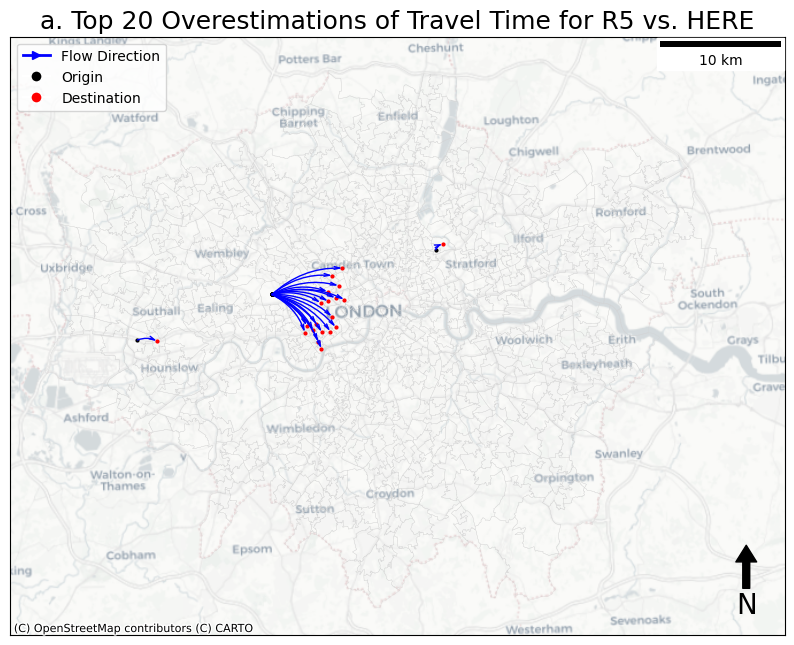

In [68]:
# Plot the base map with geometries
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='none', edgecolor='#D3D3D3', linewidth=0.2)#edgecolor='none')

# Plot curved lines on the map
#gdf_lines.plot(ax=ax, color='blue')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)

for idx, row in top_over_re_diff_r5_here_gdf.iterrows():
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                xytext=(row['origin_centroid'].x, row['origin_centroid'].y),
                arrowprops=dict(arrowstyle="->, head_width=0.1", color='blue', connectionstyle="arc3,rad=-0.2", lw=1,shrinkA=0, shrinkB=0))
    # Add points for origin and destination
    ax.plot(row['origin_centroid'].x, row['origin_centroid'].y, marker='o', color='black', markersize=2)
    ax.plot(row['dest_centroid'].x, row['dest_centroid'].y, marker='o', color='red', markersize=2)
# Add scale bar
scalebar = ScaleBar(1, location='upper right')  # 1 unit on the map equals to 1 unit in real life
ax.add_artist(scalebar)

# Add north arrow
x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
# Suppress x and y axis labels
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])



# Create a custom legend
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='>',label='Flow Direction'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=8, label='Origin'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Destination')
]
ax.legend(handles=legend_elements, loc='upper left')

ax.set_title('a. Top 20 Overestimations of Travel Time for R5 vs. HERE', fontsize=18)

# save to tiff:
plt.savefig('outputmaps/top_20_over_re_diff_r5_herev2.tiff', dpi=300)

plt.show()

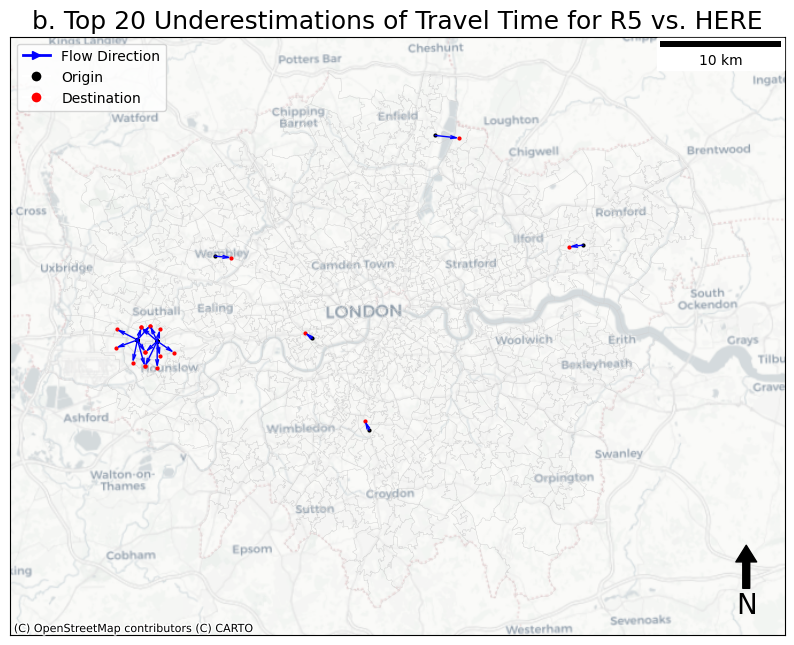

In [69]:
# Plot the base map with geometries
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='none', edgecolor='#D3D3D3', linewidth=0.2)#edgecolor='none')

# Plot curved lines on the map
#gdf_lines.plot(ax=ax, color='blue')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)

for idx, row in top_under_re_diff_r5_here_gdf.iterrows():
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                xytext=(row['origin_centroid'].x, row['origin_centroid'].y),
                arrowprops=dict(arrowstyle="->, head_width=0.1", color='blue', connectionstyle="arc,rad=-0.2", lw=1,shrinkA=0, shrinkB=0))
    # Add points for origin and destination
    ax.plot(row['origin_centroid'].x, row['origin_centroid'].y, marker='o', color='black', markersize=2)
    ax.plot(row['dest_centroid'].x, row['dest_centroid'].y, marker='o', color='red', markersize=2)
# Add scale bar
scalebar = ScaleBar(1, location='upper right')  # 1 unit on the map equals to 1 unit in real life
ax.add_artist(scalebar)

# Add north arrow
x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
# Suppress x and y axis labels
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])



# Create a custom legend
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='>',label='Flow Direction'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=8, label='Origin'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Destination')
]
ax.legend(handles=legend_elements, loc='upper left')

ax.set_title('b. Top 20 Underestimations of Travel Time for R5 vs. HERE', fontsize=18)
plt.savefig('outputmaps/top_20_under_re_diff_r5_here.tiff', dpi=300)
plt.show()

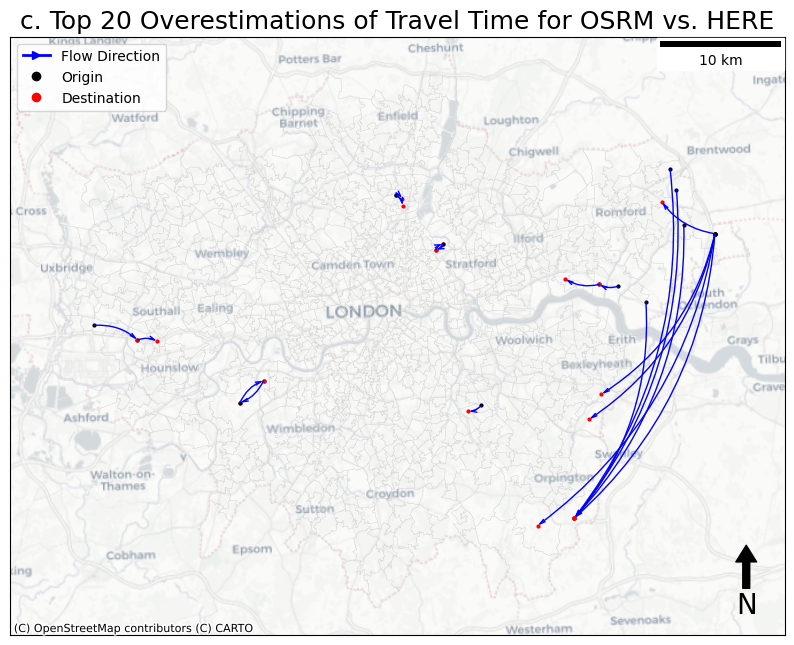

In [70]:
# Plot the base map with geometries
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='none', edgecolor='#D3D3D3', linewidth=0.2)#edgecolor='none')

# Plot curved lines on the map
#gdf_lines.plot(ax=ax, color='blue')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)

for idx, row in top_over_re_diff_osrm_here_top_n_gdf.iterrows():
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                xytext=(row['origin_centroid'].x, row['origin_centroid'].y),
                arrowprops=dict(arrowstyle="->, head_width=0.1", color='blue', connectionstyle="arc3,rad=-0.2", lw=1,shrinkA=0, shrinkB=0))
    # Add points for origin and destination
    ax.plot(row['origin_centroid'].x, row['origin_centroid'].y, marker='o', color='black', markersize=2)
    ax.plot(row['dest_centroid'].x, row['dest_centroid'].y, marker='o', color='red', markersize=2)
# Add scale bar
scalebar = ScaleBar(1, location='upper right')  # 1 unit on the map equals to 1 unit in real life
ax.add_artist(scalebar)

# Add north arrow
x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
# Suppress x and y axis labels
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])



# Create a custom legend
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='>',label='Flow Direction'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=8, label='Origin'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Destination')
]
ax.legend(handles=legend_elements, loc='upper left')

ax.set_title('c. Top 20 Overestimations of Travel Time for OSRM vs. HERE', fontsize=18)
plt.savefig('outputmaps/top_20_over_re_diff_osrm_here.tiff', dpi=300)
plt.show()

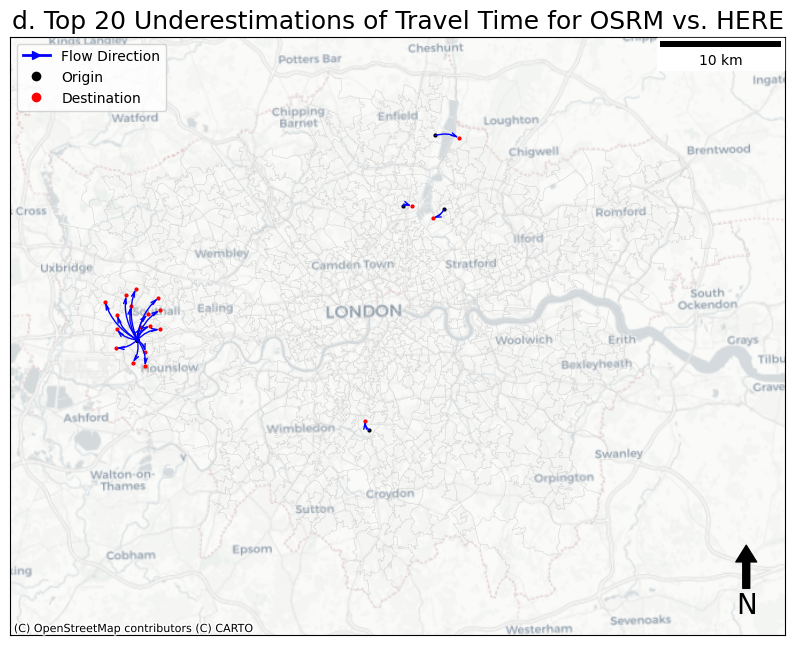

In [72]:
# Plot the base map with geometries
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='none', edgecolor='#D3D3D3', linewidth=0.2)#edgecolor='none')

# Plot curved lines on the map
#gdf_lines.plot(ax=ax, color='blue')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)

for idx, row in top_under_re_diff_osrm_here_top_n_gdf.iterrows():
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                xytext=(row['origin_centroid'].x, row['origin_centroid'].y),
                arrowprops=dict(arrowstyle="->, head_width=0.1", color='blue', connectionstyle="arc3,rad=-0.2", lw=1,shrinkA=0, shrinkB=0))
    # Add points for origin and destination
    ax.plot(row['origin_centroid'].x, row['origin_centroid'].y, marker='o', color='black', markersize=2)
    ax.plot(row['dest_centroid'].x, row['dest_centroid'].y, marker='o', color='red', markersize=2)
# Add scale bar
scalebar = ScaleBar(1, location='upper right')  # 1 unit on the map equals to 1 unit in real life
ax.add_artist(scalebar)

# Add north arrow
x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
# Suppress x and y axis labels
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])



# Create a custom legend
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='>',label='Flow Direction'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=8, label='Origin'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Destination')
]
ax.legend(handles=legend_elements, loc='upper left')

ax.set_title('d. Top 20 Underestimations of Travel Time for OSRM vs. HERE', fontsize=18)
plt.savefig('outputmaps/top_20_under_re_diff_osrm_here.tiff', dpi=300)
plt.show()

In [ ]:



top_over_re_diff_val_here_top_n_gdf
top_under_re_diff_val_here_top_n_gdf

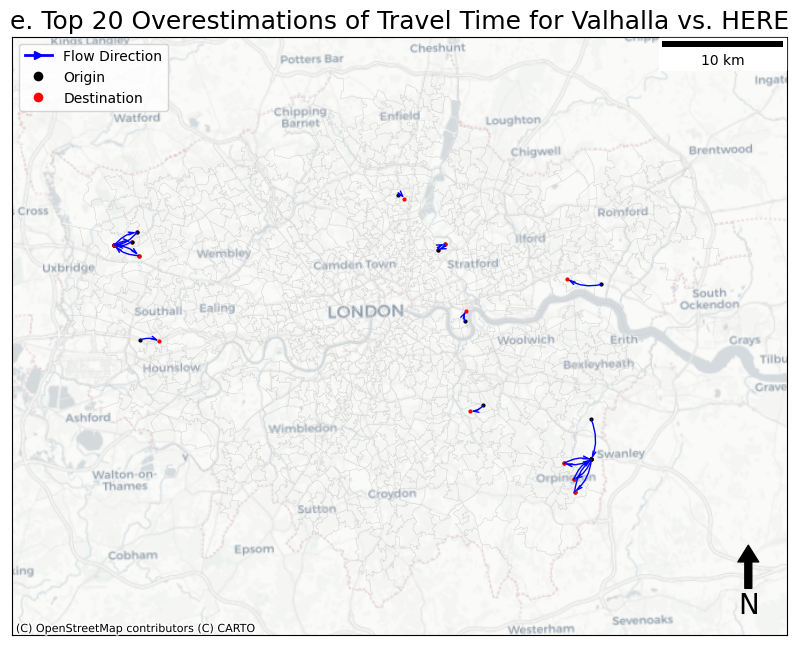

In [73]:
# Plot the base map with geometries
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='none', edgecolor='#D3D3D3', linewidth=0.2)#edgecolor='none')

# Plot curved lines on the map
#gdf_lines.plot(ax=ax, color='blue')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)

for idx, row in top_over_re_diff_val_here_top_n_gdf.iterrows():
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                xytext=(row['origin_centroid'].x, row['origin_centroid'].y),
                arrowprops=dict(arrowstyle="->, head_width=0.1", color='blue', connectionstyle="arc3,rad=-0.2", lw=1,shrinkA=0, shrinkB=0))
    # Add points for origin and destination
    ax.plot(row['origin_centroid'].x, row['origin_centroid'].y, marker='o', color='black', markersize=2)
    ax.plot(row['dest_centroid'].x, row['dest_centroid'].y, marker='o', color='red', markersize=2)
# Add scale bar
scalebar = ScaleBar(1, location='upper right')  # 1 unit on the map equals to 1 unit in real life
ax.add_artist(scalebar)

# Add north arrow
x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
# Suppress x and y axis labels
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])



# Create a custom legend
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='>',label='Flow Direction'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=8, label='Origin'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Destination')
]
ax.legend(handles=legend_elements, loc='upper left')

ax.set_title('e. Top 20 Overestimations of Travel Time for Valhalla vs. HERE', fontsize=18)
plt.savefig('outputmaps/top_20_over_re_diff_valhalla_here.tiff', dpi=300)
plt.show()

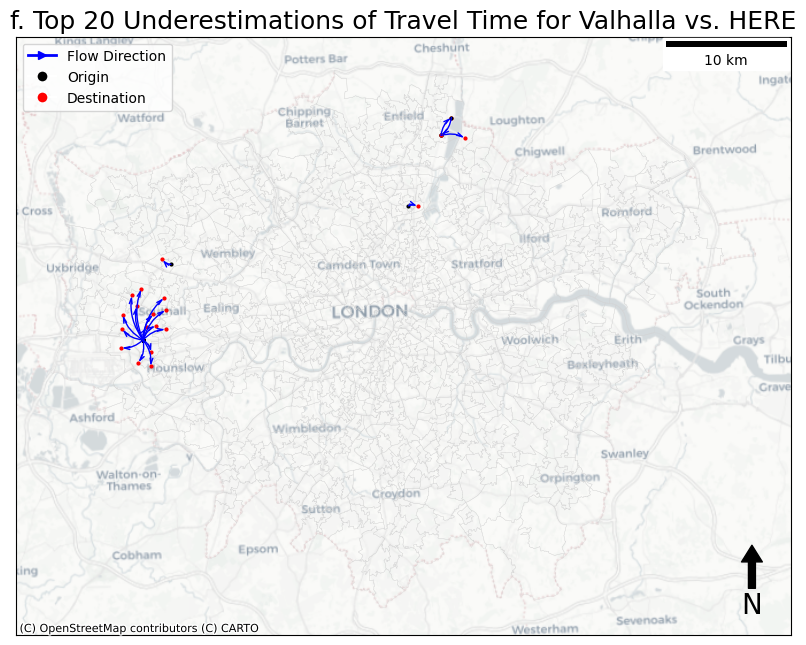

In [74]:
# Plot the base map with geometries
fig, ax = plt.subplots(figsize=(10, 10))
base = msoa_shape.plot(ax=ax, color='none', edgecolor='#D3D3D3', linewidth=0.2)#edgecolor='none')

# Plot curved lines on the map
#gdf_lines.plot(ax=ax, color='blue')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)

for idx, row in top_under_re_diff_val_here_top_n_gdf.iterrows():
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                xytext=(row['origin_centroid'].x, row['origin_centroid'].y),
                arrowprops=dict(arrowstyle="->, head_width=0.1", color='blue', connectionstyle="arc3,rad=-0.2", lw=1,shrinkA=0, shrinkB=0))
    # Add points for origin and destination
    ax.plot(row['origin_centroid'].x, row['origin_centroid'].y, marker='o', color='black', markersize=2)
    ax.plot(row['dest_centroid'].x, row['dest_centroid'].y, marker='o', color='red', markersize=2)
# Add scale bar
scalebar = ScaleBar(1, location='upper right')  # 1 unit on the map equals to 1 unit in real life
ax.add_artist(scalebar)

# Add north arrow
x, y, arrow_length = 0.95, 0.15, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
# Suppress x and y axis labels
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xticks([])
ax.set_yticks([])



# Create a custom legend
legend_elements = [
    Line2D([0], [0], color='blue', lw=2, marker='>',label='Flow Direction'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=8, label='Origin'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=8, label='Destination')
]
ax.legend(handles=legend_elements, loc='upper left')

ax.set_title('f. Top 20 Underestimations of Travel Time for Valhalla vs. HERE', fontsize=18)
plt.savefig('outputmaps/top_20_Under_re_diff_valhalla_here.tiff', dpi=300)
plt.show()

code dump

In [ ]:
#gdf_lines = gpd.GeoDataFrame(top_over_re_diff_r5_here_gdf, geometry='curved_line')

# msoa





top_over_re_diff_r5_here_gdf['curved_line'] = top_over_re_diff_r5_here_gdf.apply(lambda row: curved_line(row['origin_centroid'], row['dest_centroid'], curvature=-0.3), axis=1)

# Create a GeoDataFrame for the curved lines
gdf_lines = gpd.GeoDataFrame(top_over_re_diff_r5_here_gdf, geometry='curved_line')
# Plot the base map with geometries

fig, ax = plt.subplots()
base = msoa_shape.plot(color='white', edgecolor='#D3D3D3', figsize=(10, 10))

# Plot curved lines on the map
gdf_lines.plot(ax=base, color='blue')

# Add basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    crs=msoa_shape.crs.to_string(),
    zoom=10
)



# Add arrows to the lines
for idx, row in gdf_lines.iterrows():
    arrow = row['curved_line'].interpolate(0.5, normalized=True)  # Midpoint for the arrow
    plt.annotate('',
                 xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                 xytext=(arrow.x, arrow.y),
                 arrowprops=dict(arrowstyle="->", color='red', lw=1.5,shrinkA=0, shrinkB=5))

scalebar = ScaleBar(1, location='upper right')  # 1 unit on the map equals to 1 unit in real life

ax.add_artist(ScaleBar(1))
    
x, y, arrow_length = 0.95, 0.15, 0.1


ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='black', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)


plt.show()

# Add arrows to the lines
for idx, row in gdf_lines.iterrows():
    arrow = row['curved_line'].interpolate(0.5, normalized=True)  # Midpoint for the arrow
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['origin_centroid'].y), 
                xytext=(arrow.x, arrow.y),
                arrowprops=dict(arrowstyle="->,head_width = 0.01", connectionstyle="arc3,rad=-0.2", color='red', lw=1,  shrinkA=0, shrinkB=0))
    

legend_elements = [
    Line2D([0], [0], color='blue', lw=2, label='Origins'),
    Line2D([0], [0], color='red', lw=2, label='Destinations', marker='>', markersize=10, markerfacecolor='red', markeredgewidth=0)
]
ax.legend(handles=legend_elements, loc='upper left')

for idx, row in top_over_re_diff_r5_here_gdf.iterrows():
    ax.annotate('',
                xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                xytext=(row['origin_centroid'].x, row['origin_centroid'].y),
                arrowprops=dict(arrowstyle="->", color='red', connectionstyle="arc3,rad=-0.2", lw=1,shrinkA=0, shrinkB=0))

In [ ]:
# Determine the common color scale
vmin = -90
vmax = 900
import matplotlib.gridspec as gridspec

# Define a custom colormap
colors = [(1, 0, 0), (1, 1, 1), (1, 0, 1)]  # Red, white, green
n_bins = [0, 0.091, 1] # Define the bins for the colormap
#custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip([vmin, 0, vmax], colors)), N=256)
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(n_bins, colors)), N=256)


# Create a figure with subplots
#fig, axes = plt.subplots(2, 2, figsize=(50, 40))

fig = plt.figure(figsize=(40, 20)) 
gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 0.005],height_ratios=[3, 3], wspace=0.000001, hspace=0.2)
#, height_ratios=[1,1,1, 1])  # 2 rows, 3 columns (2 plots, 1 colorbar)

# Create axes using GridSpec
axes = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(2)]

# Flatten axes for easy iteration
#axes = axes.flatten()

###################################################################################################

counter = 0 
for ax, gdf_line, column in zip(axes, gdfs_lines, columns):

    msoa_shape_copy.boundary.plot(
        ax=ax,
        #column=column,
        #cmap='RdYlGn',
        #legend=False,  # Disable individual legends
        edgecolor='black',
        linewidth=0.5,
        zorder=1
    )
    # Plot the lines for OD pairs
    gdf_line.plot(
        ax=ax,
        column= column,  # Assuming this is the column to color lines by
        #cmap='RdYlGn',
        cmap = custom_cmap,
        linewidth=8,
        norm=plt.Normalize(vmin=vmin, vmax=vmax),
        legend=False,
        zorder=2
    )
    # plot destination points:
    gdf_line['geometry_x'].plot(
        ax=ax,
        marker='o',
        color='purple',
        markersize=100,
        label='Origin',
        zorder=3
    )
    # 
    gdf_line['geometry_y'].plot(
        ax=ax,
        marker='o',
        color='cyan',
        markersize=100,
        label='Destination',
        zorder=4
    
    )
    
    # Add basemap
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        crs=msoa_shape_copy.crs.to_string(),
        zoom=12,
        zorder = 0
    )
    # Set the extent to include the buffered area
    #ax.set_xlim([xmin, xmax])
    #ax.set_ylim([ymin, ymax])
    # Remove axis labels (coordinates)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([])
    ax.set_yticks([])
    # Add a title for each subplot
    ax.set_title(titles[counter], fontsize=30)
    counter += 1

# Create custom legend
origin_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=20, label='Origin')
destination_patch = plt.Line2D([1], [0], marker='o', color='w', markerfacecolor='cyan', markersize=20, label='Destination')




# Add the custom legend
fig.legend(handles=[origin_patch, destination_patch], loc='lower center', ncol=2, fontsize=30)

# Add a single colorbar for all subplots
#fig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax)), ax=axes, orientation='vertical', fraction=0.02, pad=0.02)#, labelsize=20)

# Add a single colorbar for all subplots
#cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
#cbar = fig.colorbar(
    #plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm),
   # cax=cbar_ax,
  #  orientation='vertical'
#)
#cbar.set_ticks([-90, 0, 900])
#cbar.ax.tick_params(labelsize=20)  


# Add a single colorbar for all subplots
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]

# Correct the norm for the colorbar
norm = plt.Normalize(vmin=-90, vmax=900)  # Use the actual min and max values

cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm),
    cax=cbar_ax,
    orientation='vertical'
)

# Set ticks to include -90, 0, and 900
cbar.set_ticks([-90, 0, 900])  # Explicitly set ticks for clarity

# Uncomment and adjust tick label size if needed
cbar.ax.tick_params(labelsize=20) 


# Save as TIFF
plt.savefig('outputmaps/combined_over_under_top_20_OD_links_with_basemap.tiff', dpi=400)
# he plot (optional)
plt.show()


/tmp/ipykernel_1737/823659770.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')  # Get the colormap
/home/mengyuwsl/.local/lib/python3.10/site-packages/contextily/tile.py:623: UserWarning: The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


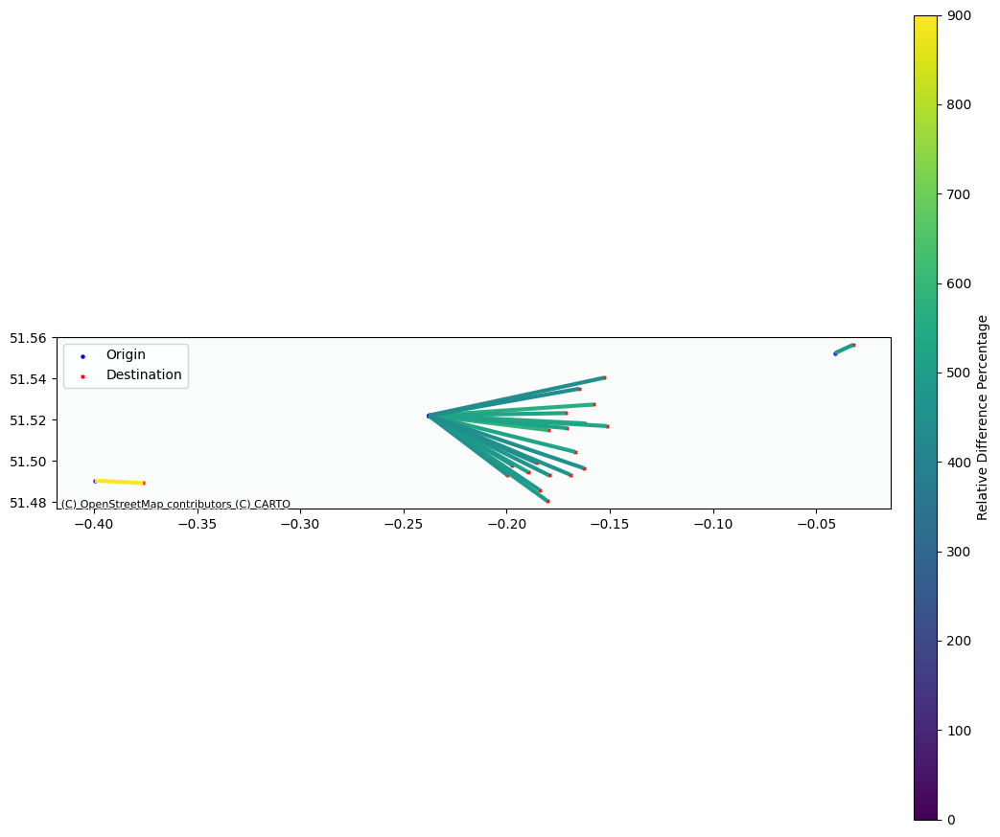

In [86]:
# Convert the dataframe to a GeoDataFrame
gdf_r5_over = gpd.GeoDataFrame(
    merged_df_over_r5, 
    geometry=gpd.points_from_xy(merged_df_over_r5.origin_lon, merged_df_over_r5.origin_lat)
)

# Convert destination points to a GeoDataFrame
gdf_r5_over['destination_geometry'] = gpd.points_from_xy(merged_df_over_r5.destination_lon, merged_df_over_r5.destination_lat)

# Create a new GeoDataFrame for the lines between origins and destinations
line_gdf = gpd.GeoDataFrame(
    merged_df_over_r5, 
    geometry=[LineString([gdf_r5_over.geometry[i], gdf_r5_over.destination_geometry[i]]) for i in range(len(gdf_r5_over))]
)


# Plotting
fig, ax = plt.subplots(figsize=(12, 12))
# set background color for the plot to white before plotting the data
#cParams['figure.facecolor'] = 'white'

# Plot lines with color based on relative_difference_percentage
# Create a custom colormap to avoid duplicates
cmap = plt.cm.get_cmap('viridis')  # Get the colormap
norm = plt.Normalize(
    vmin=0,
    vmax=900
)

# Create a scalar mappable for the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Dummy array for colorbar


# Plot lines, origins, and destinations with labels for legend
lines = line_gdf.plot(
    column='relative_difference_percentage',
    ax=ax,
    cmap=cmap,
    linewidth=3,
    norm=norm,
    label='Relative Difference Percentage'
)
origins = gdf_r5_over.plot(
    ax=ax,
    marker='o',
    color='blue',
    markersize=5,
    label='Origin'
)
destinations = gdf_r5_over['destination_geometry'].plot(
    ax=ax,
    marker='x',
    color='red',
    markersize=5,
    label='Destination'
)


ax.set_aspect('equal')


# Add basemap after plot elements are done
ctx.add_basemap(
    ax,
    crs=gdf_r5_over.crs,
    source=ctx.providers.CartoDB.Positron,
    alpha = 0.1,
    zorder = 1
)

# Adding legend
legend_elements = [
  # Get the LineCollection from the plot
    origins.collections[1],
    destinations.collections[2],
]

ax.legend(handles=legend_elements, loc="upper left")

# Adjust layout for colorbar
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Relative Difference Percentage')


# Save to TIFF
plt.savefig('outputmaps/od_map_custom.tiff', format='tiff')

# Show plot
plt.show()

In [92]:
# make a copy of the msoa_shape and convert crs to 4326:
msoa_shape_copy = msoa_shape.copy()






# make a copy of the msoa_shape and convert crs to 4326:
msoa_shape_copy = msoa_shape_copy.to_crs(epsg=4326)

In [95]:
merged_df_over_r5.head()

,destinationID,originID,relative_difference_percentage,origin_lat,origin_lon,geometry_x,destination_lat,destination_lon,geometry_y
0,E02000529,E02000530,900.000000,51.490472,-0.399550,POINT (-0.39955 51.49047),51.489234,-0.376043,POINT (-0.37604 51.48923)
1,E02000975,E02000372,587.598116,51.522036,-0.237708,POINT (-0.23771 51.52204),51.514949,-0.179854,POINT (-0.17985 51.51495)
2,E02000967,E02000372,562.686567,51.522036,-0.237708,POINT (-0.23771 51.52204),51.527353,-0.157921,POINT (-0.15792 51.52735)
3,E02000971,E02000372,549.021864,51.522036,-0.237708,POINT (-0.23771 51.52204),51.518235,-0.161988,POINT (-0.16199 51.51824)
4,E02000589,E02000372,529.213483,51.522036,-0.237708,POINT (-0.23771 51.52204),51.494532,-0.189533,POINT (-0.18953 51.49453)


In [98]:
gdf_r5_over.head()

,destinationID,originID,relative_difference_percentage,origin_lat,origin_lon,geometry_x,destination_lat,destination_lon,geometry_y,geometry
0,E02000529,E02000530,900.000000,51.490472,-0.399550,POINT (-0.39955 51.49047),51.489234,-0.376043,POINT (-0.37604 51.48923),POINT (-0.39955 51.49047)
1,E02000975,E02000372,587.598116,51.522036,-0.237708,POINT (-0.23771 51.52204),51.514949,-0.179854,POINT (-0.17985 51.51495),POINT (-0.23771 51.52204)
2,E02000967,E02000372,562.686567,51.522036,-0.237708,POINT (-0.23771 51.52204),51.527353,-0.157921,POINT (-0.15792 51.52735),POINT (-0.23771 51.52204)
3,E02000971,E02000372,549.021864,51.522036,-0.237708,POINT (-0.23771 51.52204),51.518235,-0.161988,POINT (-0.16199 51.51824),POINT (-0.23771 51.52204)
4,E02000589,E02000372,529.213483,51.522036,-0.237708,POINT (-0.23771 51.52204),51.494532,-0.189533,POINT (-0.18953 51.49453),POINT (-0.23771 51.52204)


In [99]:
# Convert the dataframe to a GeoDataFrame
gdf_r5_over = gpd.GeoDataFrame(
    merged_df_over_r5, 
    geometry=gpd.points_from_xy(merged_df_over_r5.origin_lon, merged_df_over_r5.origin_lat)
)

gdf_r5_under = gpd.GeoDataFrame(
    merged_df_under_r5, 
    geometry=gpd.points_from_xy(merged_df_under_r5.origin_lon, merged_df_under_r5.origin_lat)
)

gdf_osrm_over = gpd.GeoDataFrame(
    merged_df_over_osrm, 
    geometry=gpd.points_from_xy(merged_df_over_osrm.origin_lon, merged_df_over_osrm.origin_lat)
)

gdf_osrm_under = gpd.GeoDataFrame(
    merged_df_under_osrm, 
    geometry=gpd.points_from_xy(merged_df_under_osrm.origin_lon, merged_df_under_osrm.origin_lat)
)


# Create a new GeoDataFrame for the lines between origins and destinations
line_gdf_r5_over = gpd.GeoDataFrame(
    merged_df_over_r5, 
    geometry=[LineString([gdf_r5_over.geometry[i], gdf_r5_over.geometry_y[i]]) for i in range(len(gdf_r5_over))]
)

line_gdf_r5_under = gpd.GeoDataFrame(
    merged_df_under_r5, 
    geometry=[LineString([gdf_r5_under.geometry[i], gdf_r5_under.geometry_y[i]]) for i in range(len(gdf_r5_under))]
)

line_gdf_osrm_over = gpd.GeoDataFrame(
    merged_df_over_osrm, 
    geometry=[LineString([gdf_osrm_over.geometry[i], gdf_osrm_over.geometry_y[i]]) for i in range(len(gdf_osrm_over))]
)

line_gdf_osrm_under = gpd.GeoDataFrame(
    merged_df_under_osrm, 
    geometry=[LineString([gdf_osrm_under.geometry[i], gdf_osrm_under.geometry_y[i]]) for i in range(len(gdf_osrm_under))]
)






In [145]:
# Columns to be plotted
columns = ['relative_difference_percentage', 'relative_difference_percentage', 'relative_difference_percentage', 'relative_difference_percentage']

# Titles for each subplot
titles = ['Top 20 O-D Pairs Overestimations in Travel Time (R5 vs. HERE)', 
          'Top 20 O-D Pairs Underestimations in Travel Time (R5 vs. HERE)',
          'Top 20 O-D Pairs Overestimations in Travel Time (OSRM vs. HERE)', 
          'Top 20 O-D Pairs Underestimations in Travel Time (OSRM vs. HERE)']

In [102]:
# initialize a list of gdfs:
gdfs_to_plot = [gdf_r5_over, gdf_r5_under, gdf_osrm_over, gdf_osrm_under]
gdfs_lines = [line_gdf_r5_over, line_gdf_r5_under, line_gdf_osrm_over, line_gdf_osrm_under]

In [105]:
line_gdf_r5_over.head()

,destinationID,originID,relative_difference_percentage,origin_lat,origin_lon,geometry_x,destination_lat,destination_lon,geometry_y,geometry
0,E02000529,E02000530,900.000000,51.490472,-0.399550,POINT (-0.39955 51.49047),51.489234,-0.376043,POINT (-0.37604 51.48923),"LINESTRING (-0.39955 51.49047, -0.37604 51.48923)"
1,E02000975,E02000372,587.598116,51.522036,-0.237708,POINT (-0.23771 51.52204),51.514949,-0.179854,POINT (-0.17985 51.51495),"LINESTRING (-0.23771 51.52204, -0.17985 51.51495)"
2,E02000967,E02000372,562.686567,51.522036,-0.237708,POINT (-0.23771 51.52204),51.527353,-0.157921,POINT (-0.15792 51.52735),"LINESTRING (-0.23771 51.52204, -0.15792 51.52735)"
3,E02000971,E02000372,549.021864,51.522036,-0.237708,POINT (-0.23771 51.52204),51.518235,-0.161988,POINT (-0.16199 51.51824),"LINESTRING (-0.23771 51.52204, -0.16199 51.51824)"
4,E02000589,E02000372,529.213483,51.522036,-0.237708,POINT (-0.23771 51.52204),51.494532,-0.189533,POINT (-0.18953 51.49453),"LINESTRING (-0.23771 51.52204, -0.18953 51.49453)"


In [109]:
msoa_shape_copy.head()

,hclnm,hclnmw,label,msoa21cd,msoa21nm,name,geometry,originID_x,re_diff_tt_origin_r5,destinationID_x,re_diff_tt_dest_r5,originID_y,re_diff_tt_origin_osrm,destinationID_y,re_diff_tt_dest_osrm
0,Plumstead High Street,None,E92000001E12000007E09000011E02000318,E02000318,Greenwich 006,Greenwich 006,"POLYGON ((0.10187 51.48939, 0.10187 51.48938, ...",E02000318,-23.829541,E02000318,-25.444763,E02000318,-27.443565,E02000318,-29.884040
1,Fulham Broadway,None,E92000001E12000007E09000013E02000388,E02000388,Hammersmith and Fulham 017,Hammersmith and Fulham 017,"POLYGON ((-0.19250 51.48476, -0.19244 51.48469...",E02000388,-27.112121,E02000388,-24.566132,E02000388,-32.141563,E02000388,-29.544651
2,Streatham Vale,None,E92000001E12000007E09000022E02000652,E02000652,Lambeth 035,Lambeth 035,"POLYGON ((-0.13566 51.41806, -0.13566 51.41806...",E02000652,-27.189310,E02000652,-24.903481,E02000652,-33.521600,E02000652,-29.725393
3,Queen's Park Gardens,None,E92000001E12000007E09000033E02000963,E02000963,Westminster 004,Westminster 004,"POLYGON ((-0.20950 51.53214, -0.20945 51.53214...",E02000963,-24.048614,E02000963,-21.020387,E02000963,-30.947384,E02000963,-27.498763
4,Streatham Common,None,E92000001E12000007E09000022E02000651,E02000651,Lambeth 034,Lambeth 034,"POLYGON ((-0.11300 51.42301, -0.11319 51.42286...",E02000651,-30.882702,E02000651,-26.129727,E02000651,-35.818779,E02000651,-31.360002


In [128]:
msoa_shape_copy.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

/home/mengyuwsl/.local/lib/python3.10/site-packages/contextily/tile.py:623: UserWarning: The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


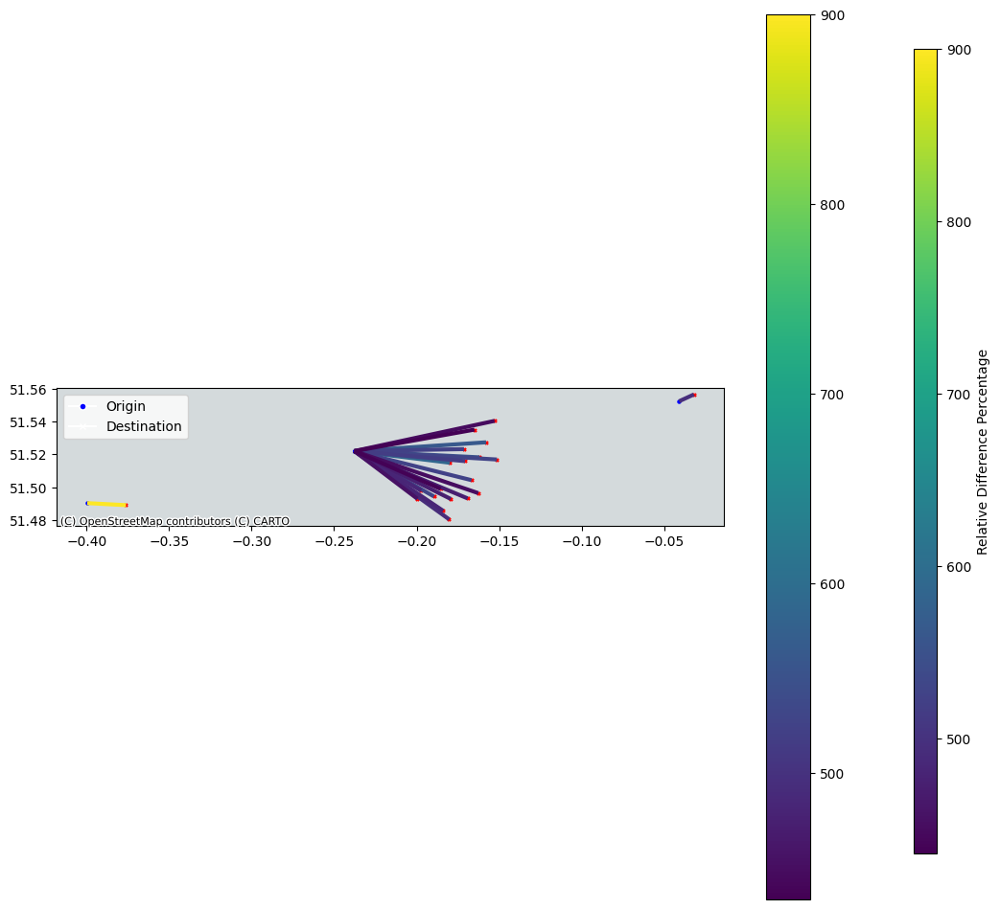

In [65]:
# Assuming your dataframe is called 'merged_df_over_r5'
# Replace this with loading your actual dataframe if needed

# Convert the dataframe to a GeoDataFrame
gdf_r5_over = gpd.GeoDataFrame(
    merged_df_over_r5, 
    geometry=gpd.points_from_xy(merged_df_over_r5.origin_lon, merged_df_over_r5.origin_lat)
)

# Convert destination points to a GeoDataFrame
gdf_r5_over['destination_geometry'] = gpd.points_from_xy(merged_df_over_r5.destination_lon, merged_df_over_r5.destination_lat)

# Create a new GeoDataFrame for the lines between origins and destinations
line_gdf = gpd.GeoDataFrame(
    merged_df_over_r5, 
    geometry=[LineString([gdf_r5_over.geometry[i], gdf_r5_over.destination_geometry[i]]) for i in range(len(gdf_r5_over))]
)

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))

# Plot lines with color based on relative_difference_percentage
norm = plt.Normalize(vmin=merged_df_over_r5['relative_difference_percentage'].min(), vmax=merged_df_over_r5['relative_difference_percentage'].max())
line_gdf.plot(column='relative_difference_percentage', ax=ax, legend=True, cmap='viridis', linewidth=3, norm=norm)

# Plot origins and destinations with different colors
gdf_r5_over.plot(ax=ax, marker='o', color='blue', markersize=5, label='Origin')
gdf_r5_over['destination_geometry'].plot(ax=ax, marker='x', color='red', markersize=5, label='Destination')

# Add basemap
ctx.add_basemap(ax, crs=gdf_r5_over.crs, source=ctx.providers.CartoDB.PositronNoLabels)

# Adding legend
plt.legend()

# Adjust layout to make space for colorbar
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Relative Difference Percentage')

# Save to TIFF
plt.savefig('outputmaps/od_map_custom.tiff', format='tiff')

# Show plot
plt.show()

1. check crs,
2. use very light maos boundary color here


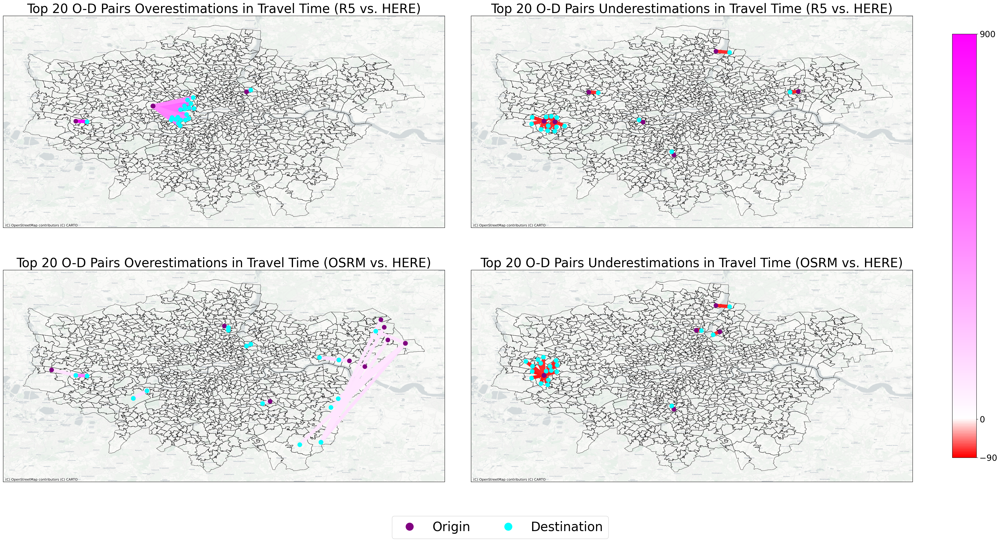

In [199]:
# Determine the common color scale
vmin = -90
vmax = 900
import matplotlib.gridspec as gridspec

# Define a custom colormap
colors = [(1, 0, 0), (1, 1, 1), (1, 0, 1)]  # Red, white, green
n_bins = [0, 0.091, 1] # Define the bins for the colormap
#custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip([vmin, 0, vmax], colors)), N=256)
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', list(zip(n_bins, colors)), N=256)


# Create a figure with subplots
#fig, axes = plt.subplots(2, 2, figsize=(50, 40))

fig = plt.figure(figsize=(40, 20)) 
gs = gridspec.GridSpec(2, 3, width_ratios=[1, 1, 0.005],height_ratios=[3, 3], wspace=0.000001, hspace=0.2)
#, height_ratios=[1,1,1, 1])  # 2 rows, 3 columns (2 plots, 1 colorbar)

# Create axes using GridSpec
axes = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(2)]

# Flatten axes for easy iteration
#axes = axes.flatten()

###################################################################################################

counter = 0 
for ax, gdf_line, column in zip(axes, gdfs_lines, columns):

    msoa_shape_copy.boundary.plot(
        ax=ax,
        #column=column,
        #cmap='RdYlGn',
        #legend=False,  # Disable individual legends
        edgecolor='black',
        linewidth=0.5,
        zorder=1
    )
    # Plot the lines for OD pairs
    gdf_line.plot(
        ax=ax,
        column= column,  # Assuming this is the column to color lines by
        #cmap='RdYlGn',
        cmap = custom_cmap,
        linewidth=8,
        norm=plt.Normalize(vmin=vmin, vmax=vmax),
        legend=False,
        zorder=2
    )
    # plot destination points:
    gdf_line['geometry_x'].plot(
        ax=ax,
        marker='o',
        color='purple',
        markersize=100,
        label='Origin',
        zorder=3
    )
    # 
    gdf_line['geometry_y'].plot(
        ax=ax,
        marker='o',
        color='cyan',
        markersize=100,
        label='Destination',
        zorder=4
    
    )
    
    # Add basemap
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        crs=msoa_shape_copy.crs.to_string(),
        zoom=12,
        zorder = 0
    )
    # Set the extent to include the buffered area
    #ax.set_xlim([xmin, xmax])
    #ax.set_ylim([ymin, ymax])
    # Remove axis labels (coordinates)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([])
    ax.set_yticks([])
    # Add a title for each subplot
    ax.set_title(titles[counter], fontsize=30)
    counter += 1

# Create custom legend
origin_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=20, label='Origin')
destination_patch = plt.Line2D([1], [0], marker='o', color='w', markerfacecolor='cyan', markersize=20, label='Destination')




# Add the custom legend
fig.legend(handles=[origin_patch, destination_patch], loc='lower center', ncol=2, fontsize=30)

# Add a single colorbar for all subplots
#fig.colorbar(plt.cm.ScalarMappable(cmap=custom_cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax)), ax=axes, orientation='vertical', fraction=0.02, pad=0.02)#, labelsize=20)

# Add a single colorbar for all subplots
#cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
#cbar = fig.colorbar(
    #plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm),
   # cax=cbar_ax,
  #  orientation='vertical'
#)
#cbar.set_ticks([-90, 0, 900])
#cbar.ax.tick_params(labelsize=20)  


# Add a single colorbar for all subplots
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]

# Correct the norm for the colorbar
norm = plt.Normalize(vmin=-90, vmax=900)  # Use the actual min and max values

cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm),
    cax=cbar_ax,
    orientation='vertical'
)

# Set ticks to include -90, 0, and 900
cbar.set_ticks([-90, 0, 900])  # Explicitly set ticks for clarity

# Uncomment and adjust tick label size if needed
cbar.ax.tick_params(labelsize=20) 


# Save as TIFF
plt.savefig('outputmaps/combined_over_under_top_20_OD_links_with_basemap.tiff', dpi=400)
# he plot (optional)
plt.show()


###################################################################################################

In [ ]:
r5_diff = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/re_diff_r5.csv', encoding = 'latin1')
osrm_diff = pd.read_csv(r'/mnt/d/University College London/Chen, Huanfa - Dissertation_Mengyu_Ding/Data/greater_london_od_mat_all/re_diff_osrm.csv', encoding = 'latin1')

Code Dump:

In [ ]:
# Difference matrices
diff_r5_here = r5TTM - hereTTM
diff_osrm_here = osrm_TTM - hereTTM
top_n = 200


def find_top_n(input_diff_df, top_n, smallest_or_largest,difference_type):
    """
    difference_type: difference or relative_difference
    top n overestimations: False
    top n underestimations: True
    """
    # 
    ranked_df = input_diff_df.unstack()
    df_top_n = ranked_df.sort_values(ascending=smallest_or_largest).head(top_n)
    df_top_n = df_top_n.reset_index()
    df_top_n.columns = [ 'destinationID', 'originID', difference_type]
    return df_top_n

# find difference:
top_n = 10
largest_diff_r5_here = find_top_n(diff_r5_here, top_n, False, 'time_difference')
smallest_diff_r5_here = find_top_n(diff_r5_here, top_n, True, 'time_difference')
largest_diff_osrm_here_top_n = find_top_n(diff_osrm_here, top_n, False, 'time_difference')
smallest_diff_osrm_here_top_n = find_top_n(diff_osrm_here, top_n, True, 'time_difference')

In [ ]:
# Plot with Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
msoa_shape.plot(
    ax=ax,
    column='re_diff_tt_origin_r5',
    cmap='RdYlGn',  # Reverse of 'RdYlGn_r' to match your colormap
    legend=True,
    edgecolor='black',
    linewidth=0.5
)

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Save as TIFF
plt.savefig('re_diff_tt_origin_r5.tiff', dpi=300)

In [ ]:
# Convert destination points to a GeoDataFrame
gdf_r5_over['destination_geometry'] = gpd.points_from_xy(merged_df_over_r5.destination_lon, merged_df_over_r5.destination_lat)

# Create a new GeoDataFrame for the lines between origins and destinations
line_gdf = gpd.GeoDataFrame(
    merged_df_over_r5, 
    geometry=[gpd.GeoSeries([gdf_r5_over.geometry[i], gdf_r5_over.destination_geometry[i]]).unary_union for i in range(len(gdf_r5_over))]
)
# Plotting
fig, ax = plt.subplots(figsize=(12, 12))

# Plot lines with color based on relative_difference_percentage
line_gdf.plot(column='relative_difference_percentage', ax=ax, legend=True, cmap='viridis', linewidth=1)

# Plot origins and destinations with different colors
gdf_r5_over.plot(ax=ax, marker='o', color='red', markersize=5, label='Origin')
gdf_r5_over['destination_geometry'].plot(ax=ax, marker='x', color='blue', markersize=5, label='Destination')

# Add basemap
ctx.add_basemap(ax, crs=gdf_r5_over.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)

# Adding legend
plt.legend()

# Save to TIFF
plt.savefig('outputmaps/od_over_r5_map.tiff', format='tiff')

# Show plot
plt.show()

In [ ]:
# Add arrows to the lines
for idx, row in gdf_lines.iterrows():
    arrow = row['curved_line'].interpolate(0.5, normalized=True)  # Midpoint for the arrow
    plt.annotate('',
                 xy=(row['dest_centroid'].x, row['dest_centroid'].y), 
                 xytext=(arrow.x, arrow.y),
                 arrowprops=dict(arrowstyle="->", color='red', lw=1.5))
    # Function to create a more curved line between two points
def curved_line(origin, destination, curvature=0.9):
    # Midpoint between origin and destination
    midpoint = ((origin.x + destination.x) / 2, (origin.y + destination.y) / 2)
    # Control point for the Bezier curve, adjusted by the curvature
    control_point = (midpoint[0] + curvature * (destination.y - origin.y), midpoint[1] + curvature * (origin.x - destination.x))
    return LineString([origin, Point(control_point), destination])